<a href="https://colab.research.google.com/github/a-garcia13/taller-2-CDA/blob/main/Taller_2_a_garcia13.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

La alcaldía de una ciudad está interesada en implementar un nuevo servicio de patinetas
para incentivar la movilidad sostenible. Como parte de este proceso, se encuentra
evaluando la viabilidad económica e impacto de dicho servicio. Dado lo anterior, le ha
encargado a usted la construcción de un modelo que permita  ***predecir la demanda de
patinetas al día*** con base en los datos de una ciudad vecina. Usted debe construir el mejor
modelo de regresión que le permita ***predecir el número de usuarios promedio por día del
nuevo servicio***, al mismo tiempo de poder entender la importancia y relación de las
variables consideradas

# 0. Importación de Librerías.

In [1]:
!pip install matplotlib==3.5.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!pip install pylev

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip (22.0 MB)


In [4]:
#Manejo de datos
import pandas as pd
import numpy as np
from datetime import datetime

#Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#Analisis profundo de datos
from pandas_profiling import ProfileReport

#Entrenamiento del modelo
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, LabelEncoder
from sklearn.linear_model import Lasso, Ridge
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator,TransformerMixin
from sklearn.model_selection import GridSearchCV

#Librerías extras
import itertools
import pylev

# 1. Entendimiento del Negocio

|     Field         |     Description                                                           |
|-------------------|---------------------------------------------------------------------------|
|     Instant       |     Record Index                                                          |
|     Date          |     Date (Format: YYYY-MM-DD)                                             |
|     Season        |     Season of the year                                                    |
|     Holiday       |     Is it holiday?                                                        |
|     Weather       |     Description of the weather situation                                  |
|     Temp          |     Temperature in Celsius                                                |
|     Feel_Temp     |     Feeling temperature in Celsius                                        |
|     Hum           |     Normalized humidity                                                   |
|     Wind          |     Wind speed in m/s                                                     |
|     Casual        |     Count of casual users                                                 |
|     Registered    |     Count of registered users                                             |
|     cnt           |     Count of total rental bikes including both casual and   registered    |

# 2. Limpieza de datos

In [5]:
url = 'https://raw.githubusercontent.com/a-garcia13/taller-2-CDA/main/Data/Data_Taller_2.csv'

data = pd.read_csv(url, sep=";")
data.head()

,instant,Date,Season,Holiday,Weather,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt
0,1,1/01/2020,Springer,No,Mist + Cloudy,"8,175849","9,090375","0,805833","10,749882",331,654,985
1,2,2/01/2020,Springer,No,Mist + Cloudy,"9,083466","8,625733","0,696087","-16,652113",131,670,801
2,3,3/01/2020,Springer,No,Few clouds,"1,229108","0,902035","0,437273","16,636703",120,1229,1349
3,4,4/01/2020,Springer,No,Few clouds,"1,4","1,969734","0,590435","10,739832",108,1454,1562
4,5,5/01/2020,Springer,No,Partly cloudy,"2,666979","2,77569","0,436957","12,5223",82,1518,1600


In [6]:
data.shape

(731, 12)

In [7]:
data.dtypes

instant        int64
Date          object
Season        object
Holiday       object
Weather       object
Temp          object
Feel_Temp     object
Hum           object
Wind          object
Casual         int64
Registered     int64
cnt            int64
dtype: object

In [8]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Tareas a realizar:

1. Remover instant ya que es un identificador.
2. Formatear la fecha
3. arreglar las clases de Weather que no estan estandarizadas
3. formatear la temperatura
4. formatear Feel_temp
5. Formatear Hum
6. Formatear wind
7. solo es necesario imputar 4 filas con datos vacios.

In [9]:
data = data.drop(columns=['instant'])
data.head(5)

,Date,Season,Holiday,Weather,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt
0,1/01/2020,Springer,No,Mist + Cloudy,"8,175849","9,090375","0,805833","10,749882",331,654,985
1,2/01/2020,Springer,No,Mist + Cloudy,"9,083466","8,625733","0,696087","-16,652113",131,670,801
2,3/01/2020,Springer,No,Few clouds,"1,229108","0,902035","0,437273","16,636703",120,1229,1349
3,4/01/2020,Springer,No,Few clouds,"1,4","1,969734","0,590435","10,739832",108,1454,1562
4,5/01/2020,Springer,No,Partly cloudy,"2,666979","2,77569","0,436957","12,5223",82,1518,1600


In [10]:
data["Date"] = pd.to_datetime(data["Date"], format='%d/%m/%Y', errors='coerce')
data.head(5)

,Date,Season,Holiday,Weather,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt
0,2020-01-01,Springer,No,Mist + Cloudy,"8,175849","9,090375","0,805833","10,749882",331,654,985
1,2020-01-02,Springer,No,Mist + Cloudy,"9,083466","8,625733","0,696087","-16,652113",131,670,801
2,2020-01-03,Springer,No,Few clouds,"1,229108","0,902035","0,437273","16,636703",120,1229,1349
3,2020-01-04,Springer,No,Few clouds,"1,4","1,969734","0,590435","10,739832",108,1454,1562
4,2020-01-05,Springer,No,Partly cloudy,"2,666979","2,77569","0,436957","12,5223",82,1518,1600


In [11]:
data["Weather"].unique()

array(['Mist + Cloudy', 'Few clouds', ' Partly    cloudy', 'Clear',
       'Mist', 'Mist + Broken clouds', ' Partly cloudy',
       'Mist + Few clouds', 'Rain + Thunderstorm',
       'Light Rain + Scattered clouds', 'Snow'], dtype=object)

In [12]:
data.loc[data["Weather"] == ' Partly    cloudy', "Weather"] = 'Partly cloudy'
data.loc[data["Weather"] ==  ' Partly cloudy', "Weather"] = 'Partly cloudy'
data["Weather"].unique()

array(['Mist + Cloudy', 'Few clouds', 'Partly cloudy', 'Clear', 'Mist',
       'Mist + Broken clouds', 'Mist + Few clouds', 'Rain + Thunderstorm',
       'Light Rain + Scattered clouds', 'Snow'], dtype=object)

In [13]:
data = data.dropna()

In [14]:
data['Temp'] = data['Temp'].str.replace(',','.')
data['Feel_Temp'] = data['Feel_Temp'].str.replace(',','.')
data['Hum'] = data['Hum'].str.replace(',','.')
data['Wind'] = data['Wind'].str.replace(',','.')
data['Temp'] = data['Temp'].astype(float)
data['Feel_Temp'] = data['Feel_Temp'].astype(float)
data['Hum'] = data['Hum'].astype(float)
data['Wind'] = data['Wind'].astype(float)
data

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,Date,Season,Holiday,Weather,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt
0,2020-01-01,Springer,No,Mist + Cloudy,8.175849,9.090375,0.805833,10.749882,331,654,985
1,2020-01-02,Springer,No,Mist + Cloudy,9.083466,8.625733,0.696087,-16.652113,131,670,801
2,2020-01-03,Springer,No,Few clouds,1.229108,0.902035,0.437273,16.636703,120,1229,1349
3,2020-01-04,Springer,No,Few clouds,1.400000,1.969734,0.590435,10.739832,108,1454,1562
4,2020-01-05,Springer,No,Partly cloudy,2.666979,2.775690,0.436957,12.522300,82,1518,1600
...,...,...,...,...,...,...,...,...,...,...,...
726,2021-12-27,Springer,No,Mist + Cloudy,3.945849,2.652174,0.652917,23.458911,247,1867,2114
727,2021-12-28,Springer,No,Mist + Few clouds,3.906651,3.987162,0.590000,10.416557,644,2451,3095
728,2021-12-29,Springer,No,Mist,3.906651,3.392800,0.752917,8.333661,159,1182,1341
729,2021-12-30,Springer,No,Few clouds,4.024151,2.889900,0.483333,23.500518,364,1432,1796


In [15]:
data.dtypes

Date          datetime64[ns]
Season                object
Holiday               object
Weather               object
Temp                 float64
Feel_Temp            float64
Hum                  float64
Wind                 float64
Casual                 int64
Registered             int64
cnt                    int64
dtype: object

In [16]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 3. Creación de nuevas variables segun el negocio

- Al consultar a un meteorólogo, este sugiere agrupar las precipitaciones en un
grupo, la neblina en otro grupo y el resto en otro.
- Es de interés particular el comportamiento de los usuarios durante la semana.


In [17]:
data['Weekday'] = data['Date'].dt.day_name()
data

,Date,Season,Holiday,Weather,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt,Weekday
0,2020-01-01,Springer,No,Mist + Cloudy,8.175849,9.090375,0.805833,10.749882,331,654,985,Wednesday
1,2020-01-02,Springer,No,Mist + Cloudy,9.083466,8.625733,0.696087,-16.652113,131,670,801,Thursday
2,2020-01-03,Springer,No,Few clouds,1.229108,0.902035,0.437273,16.636703,120,1229,1349,Friday
3,2020-01-04,Springer,No,Few clouds,1.400000,1.969734,0.590435,10.739832,108,1454,1562,Saturday
4,2020-01-05,Springer,No,Partly cloudy,2.666979,2.775690,0.436957,12.522300,82,1518,1600,Sunday
...,...,...,...,...,...,...,...,...,...,...,...,...
726,2021-12-27,Springer,No,Mist + Cloudy,3.945849,2.652174,0.652917,23.458911,247,1867,2114,Monday
727,2021-12-28,Springer,No,Mist + Few clouds,3.906651,3.987162,0.590000,10.416557,644,2451,3095,Tuesday
728,2021-12-29,Springer,No,Mist,3.906651,3.392800,0.752917,8.333661,159,1182,1341,Wednesday
729,2021-12-30,Springer,No,Few clouds,4.024151,2.889900,0.483333,23.500518,364,1432,1796,Thursday


In [18]:
def grupo_climatico(x):
  niebla = "Mist"
  lluvia = "Rain"
  otro = "Other"
  if niebla in x:
    return niebla
  elif lluvia in x:
    return lluvia
  else:
    return otro

In [19]:
data["Weather group"] = data["Weather"].apply(lambda x: grupo_climatico(x))

In [20]:
data

,Date,Season,Holiday,Weather,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt,Weekday,Weather group
0,2020-01-01,Springer,No,Mist + Cloudy,8.175849,9.090375,0.805833,10.749882,331,654,985,Wednesday,Mist
1,2020-01-02,Springer,No,Mist + Cloudy,9.083466,8.625733,0.696087,-16.652113,131,670,801,Thursday,Mist
2,2020-01-03,Springer,No,Few clouds,1.229108,0.902035,0.437273,16.636703,120,1229,1349,Friday,Other
3,2020-01-04,Springer,No,Few clouds,1.400000,1.969734,0.590435,10.739832,108,1454,1562,Saturday,Other
4,2020-01-05,Springer,No,Partly cloudy,2.666979,2.775690,0.436957,12.522300,82,1518,1600,Sunday,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,2021-12-27,Springer,No,Mist + Cloudy,3.945849,2.652174,0.652917,23.458911,247,1867,2114,Monday,Mist
727,2021-12-28,Springer,No,Mist + Few clouds,3.906651,3.987162,0.590000,10.416557,644,2451,3095,Tuesday,Mist
728,2021-12-29,Springer,No,Mist,3.906651,3.392800,0.752917,8.333661,159,1182,1341,Wednesday,Mist
729,2021-12-30,Springer,No,Few clouds,4.024151,2.889900,0.483333,23.500518,364,1432,1796,Thursday,Other


# 4. Analisis Exploratorio

## 4.1 Variables Cualitativas

Primero realizaremos un anailisis exploratorio para las variables cualitativas:
- Season    
- Holiday           
- Weather
- Weather group
- Weekday

[Text(0, 0, '186'), Text(0, 0, '183'), Text(0, 0, '179'), Text(0, 0, '178')]

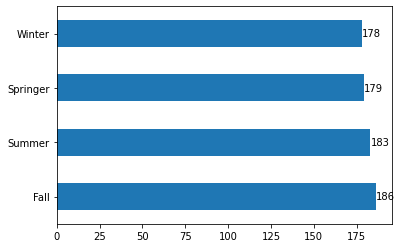

In [21]:
ax = data['Season'].value_counts().plot.barh()
ax.bar_label(ax.containers[0])

[Text(0, 0, '705'), Text(0, 0, '21')]

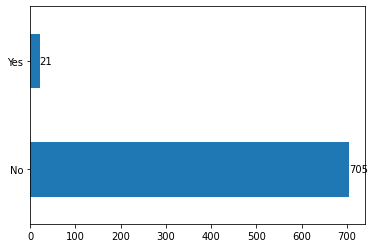

In [22]:
ax = data['Holiday'].value_counts().plot.barh()
ax.bar_label(ax.containers[0])

<AxesSubplot:title={'center':'Weather'}, ylabel='Weather'>

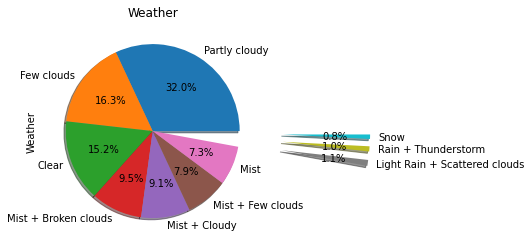

In [23]:
data['Weather'].value_counts().plot.pie(y='', title="Weather", legend=False, \
                   autopct='%1.1f%%', explode=(0, 0, 0, 0, 0, 0, 0, 1.5, 1.5, 1.5), shadow=True, startangle=0)

<AxesSubplot:title={'center':'Weather group'}, ylabel='Weather group'>

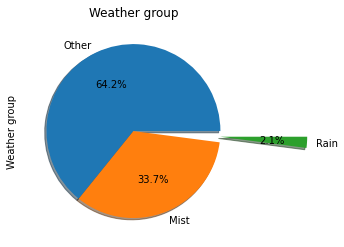

In [24]:
data['Weather group'].value_counts().plot.pie(y='', title="Weather group", legend=False, \
                   autopct='%1.1f%%', explode=(0, 0, 1), shadow=True, startangle=0)

[Text(0, 0, '105'),
 Text(0, 0, '104'),
 Text(0, 0, '104'),
 Text(0, 0, '104'),
 Text(0, 0, '103'),
 Text(0, 0, '103'),
 Text(0, 0, '103')]

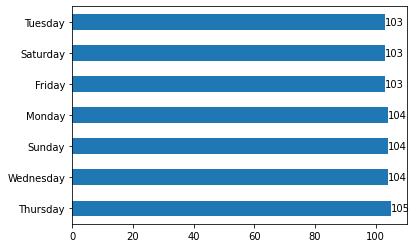

In [25]:
ax = data['Weekday'].value_counts().plot.barh()
ax.bar_label(ax.containers[0])

## 4.2 Variables Cuantitativas

Ahora realizaremos un anailisis exploratorio para las variables cuantitativas:
- Temp                 
- Feel_Temp            
- Hum                  
- Wind                 
- Casual                 
- Registered             
- cnt                    

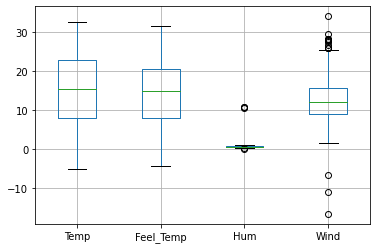

In [26]:
b_plot = data.boxplot(column = ['Temp', "Feel_Temp", "Hum", "Wind"]) 

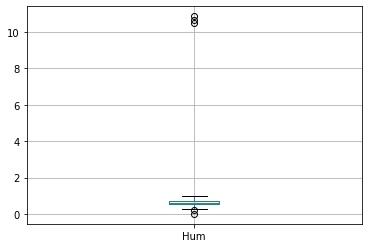

In [27]:
b_plot = data.boxplot(column = ["Hum"]) 

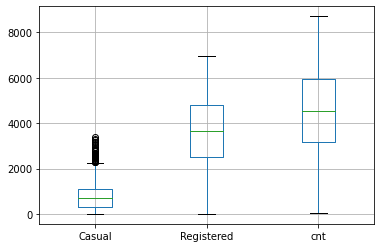

In [28]:
b_plot = data.boxplot(column = ["Casual", "Registered", "cnt"]) 

## 4.3 Analisis multivariado

Para el analisis multivariado estudiaremos la relacion de la variable de interes (cnt) con todas las otras variables.

In [29]:
corr = data.corr()
corr.style.background_gradient(cmap='coolwarm')

,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt
Temp,1.000000,0.991671,-0.000423,-0.144283,0.543628,0.538182,0.626448
Feel_Temp,0.991671,1.000000,0.005931,-0.168480,0.544135,0.542313,0.629954
Hum,-0.000423,0.005931,1.000000,-0.085655,0.009527,-0.035417,-0.025129
Wind,-0.144283,-0.168480,-0.085655,1.000000,-0.151749,-0.195015,-0.210925
Casual,0.543628,0.544135,0.009527,-0.151749,1.000000,0.394262,0.672729
Registered,0.538182,0.542313,-0.035417,-0.195015,0.394262,1.000000,0.945188
cnt,0.626448,0.629954,-0.025129,-0.210925,0.672729,0.945188,1.000000


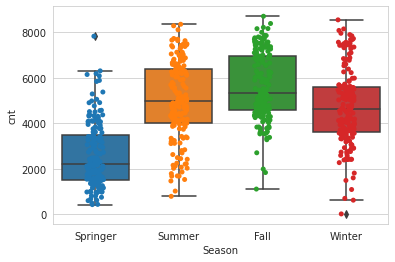

In [30]:
sns.set_style('whitegrid')
ax= sns.boxplot(x='Season',y='cnt',data= data)
ax = sns.stripplot(x="Season", y="cnt",data= data)

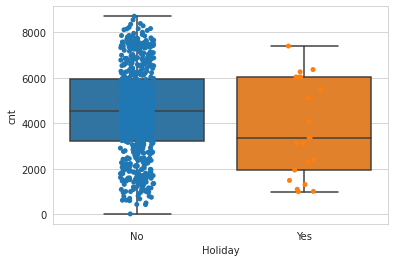

In [31]:
sns.set_style('whitegrid')
ax= sns.boxplot(x='Holiday',y='cnt',data= data)
ax = sns.stripplot(x="Holiday", y="cnt",data= data)

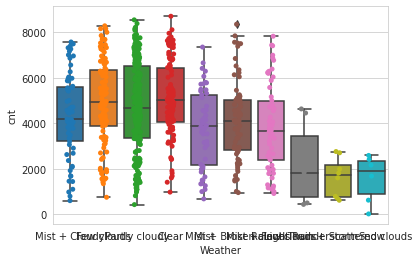

In [32]:
sns.set_style('whitegrid')
ax= sns.boxplot(x='Weather',y='cnt',data= data)
ax = sns.stripplot(x="Weather", y="cnt",data= data)

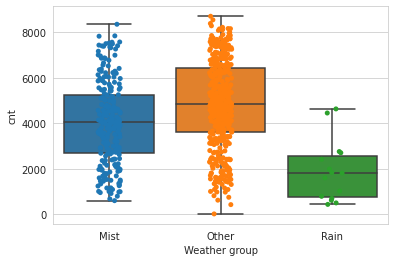

In [33]:
sns.set_style('whitegrid')
ax= sns.boxplot(x='Weather group',y='cnt',data= data)
ax = sns.stripplot(x="Weather group", y="cnt",data= data)

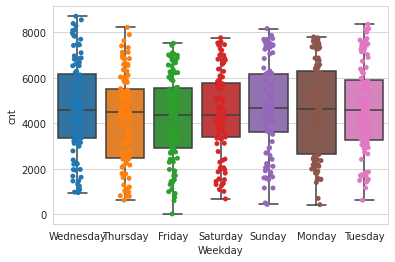

In [34]:
sns.set_style('whitegrid')
ax= sns.boxplot(x='Weekday',y='cnt',data= data)
ax = sns.stripplot(x="Weekday", y="cnt",data= data)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


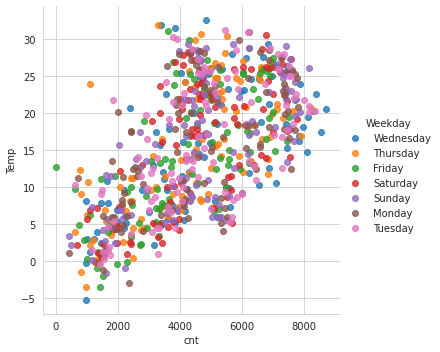

In [35]:
sns.lmplot('cnt', 'Temp', data=data, hue='Weekday', fit_reg=False)

plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


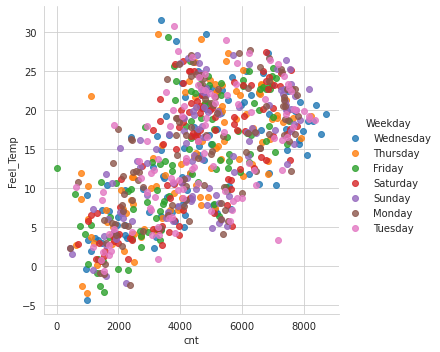

In [36]:
sns.lmplot('cnt', 'Feel_Temp', data=data, hue='Weekday', fit_reg=False)

plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


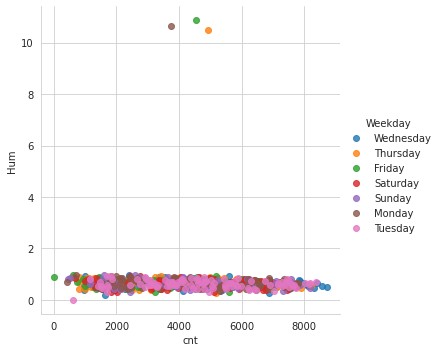

In [37]:
sns.lmplot('cnt', 'Hum', data=data, hue='Weekday', fit_reg=False)

plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


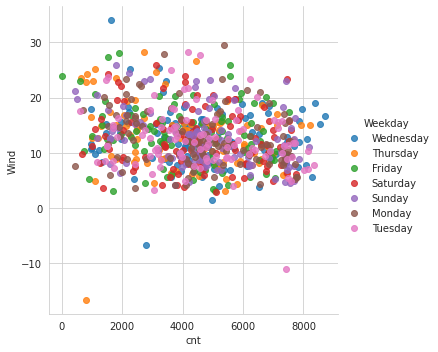

In [38]:
sns.lmplot('cnt', 'Wind', data=data, hue='Weekday', fit_reg=False)

plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


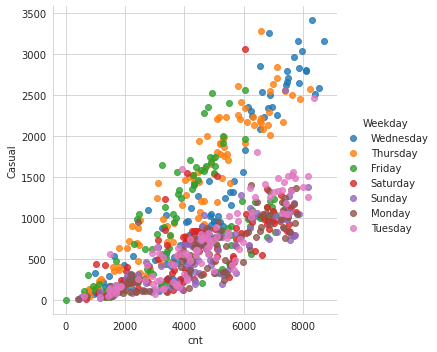

In [39]:
sns.lmplot('cnt', 'Casual', data=data, hue='Weekday', fit_reg=False)

plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


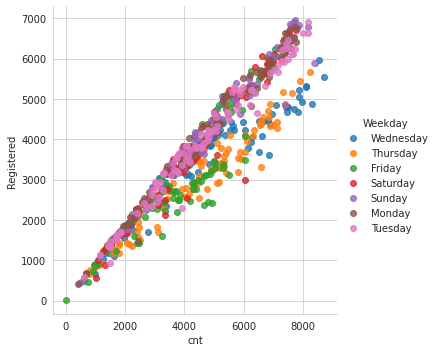

In [40]:
sns.lmplot('cnt', 'Registered', data=data, hue='Weekday', fit_reg=False)

plt.show()

## 4.4 Conclusiones del analisis

# 5. Preparacion del modelo

Paso 1: convertir las variables categoricas a numericas.
- Season  -> baja cardinalidad -> one-hot   
- Holiday           -> baja cardinalidad -> one-hot
- Weather        -> baja cardinalidad -> one-hot
- Weather group     -> baja cardinalidad -> one-hot
- Weekday   -> baja cardinalidad -> one-hot

Paso 2: quitar la columna de la fecha que seria un identificador



In [41]:
data_main = data.copy()
data_main.columns = data_main.columns.str.replace(' ', '_')
data_main.columns

Index(['Date', 'Season', 'Holiday', 'Weather', 'Temp', 'Feel_Temp', 'Hum',
       'Wind', 'Casual', 'Registered', 'cnt', 'Weekday', 'Weather_group'],
      dtype='object')

In [42]:
y = pd.get_dummies(data_main.Season, prefix='season')
z = pd.get_dummies(data_main.Holiday, prefix='holiday')
f = pd.get_dummies(data_main.Weather, prefix='weather')
x = pd.get_dummies(data_main.Weather_group, prefix='wg')
w = pd.get_dummies(data_main.Weekday, prefix='weekday')
print(y.head())

   season_Fall  season_Springer  season_Summer  season_Winter
0            0                1              0              0
1            0                1              0              0
2            0                1              0              0
3            0                1              0              0
4            0                1              0              0


In [43]:
data_main =  data_main.join(y).drop(columns=['Season'])
data_main =  data_main.join(z).drop(columns=['Holiday'])
data_main =  data_main.join(f).drop(columns=['Weather'])
data_main =  data_main.join(x).drop(columns=['Weather_group'])
data_main =  data_main.join(w).drop(columns=['Weekday'])
data_main

,Date,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt,season_Fall,season_Springer,...,wg_Mist,wg_Other,wg_Rain,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
0,2020-01-01,8.175849,9.090375,0.805833,10.749882,331,654,985,0,1,...,1,0,0,0,0,0,0,0,0,1
1,2020-01-02,9.083466,8.625733,0.696087,-16.652113,131,670,801,0,1,...,1,0,0,0,0,0,0,1,0,0
2,2020-01-03,1.229108,0.902035,0.437273,16.636703,120,1229,1349,0,1,...,0,1,0,1,0,0,0,0,0,0
3,2020-01-04,1.400000,1.969734,0.590435,10.739832,108,1454,1562,0,1,...,0,1,0,0,0,1,0,0,0,0
4,2020-01-05,2.666979,2.775690,0.436957,12.522300,82,1518,1600,0,1,...,0,1,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,2021-12-27,3.945849,2.652174,0.652917,23.458911,247,1867,2114,0,1,...,1,0,0,0,1,0,0,0,0,0
727,2021-12-28,3.906651,3.987162,0.590000,10.416557,644,2451,3095,0,1,...,1,0,0,0,0,0,0,0,1,0
728,2021-12-29,3.906651,3.392800,0.752917,8.333661,159,1182,1341,0,1,...,1,0,0,0,0,0,0,0,0,1
729,2021-12-30,4.024151,2.889900,0.483333,23.500518,364,1432,1796,0,1,...,0,1,0,0,0,0,0,1,0,0


In [44]:
data_main = data_main.drop(columns=['Date'])
data_main.head(5)

,Temp,Feel_Temp,Hum,Wind,Casual,Registered,cnt,season_Fall,season_Springer,season_Summer,...,wg_Mist,wg_Other,wg_Rain,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
0,8.175849,9.090375,0.805833,10.749882,331,654,985,0,1,0,...,1,0,0,0,0,0,0,0,0,1
1,9.083466,8.625733,0.696087,-16.652113,131,670,801,0,1,0,...,1,0,0,0,0,0,0,1,0,0
2,1.229108,0.902035,0.437273,16.636703,120,1229,1349,0,1,0,...,0,1,0,1,0,0,0,0,0,0
3,1.400000,1.969734,0.590435,10.739832,108,1454,1562,0,1,0,...,0,1,0,0,0,1,0,0,0,0
4,2.666979,2.775690,0.436957,12.522300,82,1518,1600,0,1,0,...,0,1,0,0,0,0,1,0,0,0


# 6. Implementacion del model

## 6.1 Modelo de prediccion de usuarios promedio

Para este modelo la variable objetivo es una nueva columna que es la suma de casual y registered, y es necesario dropear la columna de CNT ya que tiene muy alta correlacion.

In [45]:
data_up = data_main.copy()
data_up = data_up.drop(columns=['cnt'])
data_up.head(5)

,Temp,Feel_Temp,Hum,Wind,Casual,Registered,season_Fall,season_Springer,season_Summer,season_Winter,...,wg_Mist,wg_Other,wg_Rain,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
0,8.175849,9.090375,0.805833,10.749882,331,654,0,1,0,0,...,1,0,0,0,0,0,0,0,0,1
1,9.083466,8.625733,0.696087,-16.652113,131,670,0,1,0,0,...,1,0,0,0,0,0,0,1,0,0
2,1.229108,0.902035,0.437273,16.636703,120,1229,0,1,0,0,...,0,1,0,1,0,0,0,0,0,0
3,1.400000,1.969734,0.590435,10.739832,108,1454,0,1,0,0,...,0,1,0,0,0,1,0,0,0,0
4,2.666979,2.775690,0.436957,12.522300,82,1518,0,1,0,0,...,0,1,0,0,0,0,1,0,0,0


In [46]:
data_up["Users"] = data_up["Casual"] + data_up["Registered"]
data_up = data_up.drop(columns=['Casual'])
data_up = data_up.drop(columns=['Registered'])
data_up.head(5)

,Temp,Feel_Temp,Hum,Wind,season_Fall,season_Springer,season_Summer,season_Winter,holiday_No,holiday_Yes,...,wg_Other,wg_Rain,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday,Users
0,8.175849,9.090375,0.805833,10.749882,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,1,985
1,9.083466,8.625733,0.696087,-16.652113,0,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,801
2,1.229108,0.902035,0.437273,16.636703,0,1,0,0,1,0,...,1,0,1,0,0,0,0,0,0,1349
3,1.400000,1.969734,0.590435,10.739832,0,1,0,0,1,0,...,1,0,0,0,1,0,0,0,0,1562
4,2.666979,2.775690,0.436957,12.522300,0,1,0,0,1,0,...,1,0,0,0,0,1,0,0,0,1600


In [47]:
train, test = train_test_split(data_up, test_size=0.2, random_state=33)
train.head()

,Temp,Feel_Temp,Hum,Wind,season_Fall,season_Springer,season_Summer,season_Winter,holiday_No,holiday_Yes,...,wg_Other,wg_Rain,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday,Users
560,25.056651,23.303974,0.699167,9.626493,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,6969
408,2.457500,2.711911,0.411250,11.207961,0,1,0,0,1,0,...,1,0,0,0,1,0,0,0,0,3422
634,21.845000,20.040811,0.630833,16.374800,0,0,0,1,1,0,...,1,0,0,0,0,1,0,0,0,7733
714,7.235849,7.904001,0.650417,7.125450,0,0,0,1,1,0,...,1,0,0,0,0,0,0,0,1,5047
398,6.726651,6.539262,0.526667,11.959232,0,1,0,0,1,0,...,1,0,0,0,0,0,0,0,1,4151


In [48]:
X_train, y_train = train.drop(['Users'],axis=1), train['Users'] 
display(X_train)
y_train

,Temp,Feel_Temp,Hum,Wind,season_Fall,season_Springer,season_Summer,season_Winter,holiday_No,holiday_Yes,...,wg_Mist,wg_Other,wg_Rain,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
560,25.056651,23.303974,0.699167,9.626493,1,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,1
408,2.457500,2.711911,0.411250,11.207961,0,1,0,0,1,0,...,0,1,0,0,0,1,0,0,0,0
634,21.845000,20.040811,0.630833,16.374800,0,0,0,1,1,0,...,0,1,0,0,0,0,1,0,0,0
714,7.235849,7.904001,0.650417,7.125450,0,0,0,1,1,0,...,0,1,0,0,0,0,0,0,0,1
398,6.726651,6.539262,0.526667,11.959232,0,1,0,0,1,0,...,0,1,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202,31.871651,31.522112,0.580417,8.917700,1,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,1
662,19.612500,18.259887,0.636250,4.876206,0,0,0,1,1,0,...,0,1,0,0,0,0,1,0,0,0
582,28.150849,26.360713,0.652500,19.458207,1,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0
393,5.277500,4.817887,0.311250,16.083350,0,1,0,0,1,0,...,0,1,0,1,0,0,0,0,0,0


560    6969
408    3422
634    7733
714    5047
398    4151
       ... 
202    3387
662    7693
582    5464
393    3243
20     1543
Name: Users, Length: 580, dtype: int64

In [49]:
X_test, y_test = test.drop(['Users'],axis=1), test['Users'] 
display(X_test)
y_test

,Temp,Feel_Temp,Hum,Wind,season_Fall,season_Springer,season_Summer,season_Winter,holiday_No,holiday_Yes,...,wg_Mist,wg_Other,wg_Rain,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
601,25.017500,22.413700,0.615000,4.833769,1,0,0,0,1,0,...,1,0,0,0,0,0,0,0,1,0
278,15.225849,14.579975,0.620833,9.041918,0,0,0,1,1,0,...,0,1,0,0,0,0,0,0,1,0
358,4.914801,5.158167,0.681304,10.391097,0,1,0,0,1,0,...,0,1,0,1,0,0,0,0,0,0
122,20.983349,19.357713,0.697083,22.958689,0,0,1,0,1,0,...,1,0,0,0,0,0,1,0,0,0
625,19.299151,17.993350,0.734583,10.166714,1,0,0,0,1,0,...,1,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
480,14.403349,14.104899,0.427917,7.959064,0,0,1,0,1,0,...,0,1,0,0,0,0,1,0,0,0
37,4.768349,6.271926,0.738333,3.042356,0,1,0,0,1,0,...,0,1,0,1,0,0,0,0,0,0
527,25.879151,23.006887,0.587917,13.916771,0,0,1,0,1,0,...,1,0,0,1,0,0,0,0,0,0
631,16.870849,16.389851,0.467083,14.958286,0,0,0,1,1,0,...,0,1,0,0,0,0,0,1,0,0


601    7582
278    4765
358     754
122    4451
625    6869
       ... 
480    6196
37     1712
527    6664
631    7907
360    1162
Name: Users, Length: 146, dtype: int64

In [50]:
class ToPolynomial(BaseEstimator,TransformerMixin):
    def __init__(self,k=2):
        self.k = k

    def fit(self,X,y=None):
        return self
    
    def transform(self,X,y=None):
        columns = X.columns
        X_train_pol = pd.concat([X**(i+1) for i in range(self.k)],axis=1) #Polinomios sin interacciones
        X_train_pol.columns = np.reshape([[i+' '+str(j+1) for i in columns] for j in range(self.k)],-1)
        temp = pd.concat([X[i[0]]*X[i[1]] for i in list(itertools.combinations(columns, 2))],axis=1) #Combinaciones sólo de grado 1
        temp.columns = [' '.join(i) for i in list(itertools.combinations(columns, 2))]
        X_train_pol = pd.concat([X_train_pol,temp],axis=1)
        return X_train_pol

In [51]:
estimators = [
        ("normalizar", StandardScaler()),
        ('polinomial',ToPolynomial()),
        ('regresion', Lasso())          
    ]

pipe = Pipeline(estimators)

parameters = {
              'normalizar': [StandardScaler(),'passthrough'],
              'polinomial__k':[2,3,4,5,'passthrough'],
              "regresion": [Ridge(), Lasso()],
              'regresion__alpha': [0, 0.001, 0.01, 0.1, 1, 10, 100, 200, 300, 1000]
              }

grid_search = GridSearchCV(pipe, parameters, verbose=2, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)

In [52]:
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
600 fits failed out of a total of 1000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
500 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/pipeline.py", line 390, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/pipeline.py", line 355, in _fit
    **fit_params_steps[name],
  File "/usr/local/lib/python3.7/dist-packages/joblib/memory.py", 

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('normalizar', StandardScaler()),
                                       ('polinomial', ToPolynomial()),
                                       ('regresion', Lasso())]),
             n_jobs=-1,
             param_grid={'normalizar': [StandardScaler(), 'passthrough'],
                         'polinomial__k': [2, 3, 4, 5, 'passthrough'],
                         'regresion': [Ridge(), Lasso(alpha=200)],
                         'regresion__alpha': [0, 0.001, 0.01, 0.1, 1, 10, 100,
                                              200, 300, 1000]},
             scoring='neg_mean_squared_error', verbose=2)

In [53]:
best_model = grid_search.best_estimator_

pd.DataFrame(grid_search.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_normalizar,param_polinomial__k,param_regresion,param_regresion__alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.005394,0.000873,0.0,0.0,StandardScaler(),2,Ridge(),0,"{'normalizar': StandardScaler(), 'polinomial__...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,99
1,0.004915,0.000563,0.0,0.0,StandardScaler(),2,Ridge(),0.001,"{'normalizar': StandardScaler(), 'polinomial__...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,127
2,0.004749,0.000485,0.0,0.0,StandardScaler(),2,Ridge(),0.01,"{'normalizar': StandardScaler(), 'polinomial__...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,128
3,0.005934,0.003061,0.0,0.0,StandardScaler(),2,Ridge(),0.1,"{'normalizar': StandardScaler(), 'polinomial__...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,129
4,0.004590,0.000212,0.0,0.0,StandardScaler(),2,Ridge(),1,"{'normalizar': StandardScaler(), 'polinomial__...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,130
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.000946,0.000130,0.0,0.0,passthrough,passthrough,Lasso(alpha=200),10,"{'normalizar': 'passthrough', 'polinomial__k':...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,83
196,0.001094,0.000184,0.0,0.0,passthrough,passthrough,Lasso(alpha=200),100,"{'normalizar': 'passthrough', 'polinomial__k':...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,82
197,0.001826,0.001513,0.0,0.0,passthrough,passthrough,Lasso(alpha=200),200,"{'normalizar': 'passthrough', 'polinomial__k':...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
198,0.000805,0.000031,0.0,0.0,passthrough,passthrough,Lasso(alpha=200),300,"{'normalizar': 'passthrough', 'polinomial__k':...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,187


In [54]:
grid_search.best_params_

{'normalizar': 'passthrough',
 'polinomial__k': 2,
 'regresion': Lasso(alpha=200),
 'regresion__alpha': 200}

In [55]:
y_pred_train = best_model.predict(X_train)
y_pred_test = best_model.predict(X_test)

n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

n,p = X_test.shape

print('------------ Regresión Lasso con evaluación ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con entrenamiento------------
Residual sum of squares (MSE): 1528071.85
R2-score: 0.57928
Adj R2-score: 0.55629
------------ Regresión Lasso con evaluación ------------
Residual sum of squares (MSE): 1761439.37
R2-score: 0.57752
Adj R2-score: 0.46731


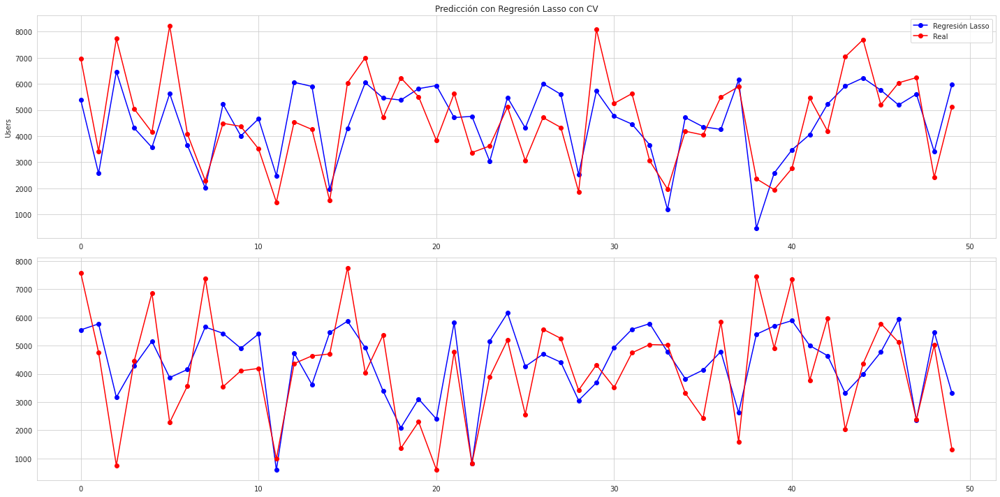

In [56]:
%matplotlib inline
fig, axs = plt.subplots(2,figsize=(20,10))

xvals = list(range(len(y_test[:50])))
axs[0].plot(xvals, y_pred_train[:50],'bo-', label='Regresión Lasso')
axs[0].plot(xvals, y_train[:50],'ro-', label='Real')

axs[1].plot(xvals, y_pred_test[:50],'bo-', label='Regresión Lasso')
axs[1].plot(xvals, y_test[:50],'ro-', label='Real')

axs[0].set(title='Predicción con Regresión Lasso con CV',ylabel=y_train.name)
axs[0].legend()

plt.tight_layout()
plt.show()

In [57]:
lasso_model = best_model['regresion']
fake_df = best_model['polinomial'].transform(X_test)
print(f'Intercepto: {lasso_model.intercept_}')
coef = list(zip(['Intercepto'] + list(fake_df.columns), [lasso_model.intercept_] + list(lasso_model.coef_)))
coef = pd.DataFrame(coef,columns=['Variable','Parámetro'])
coef.sort_values('Parámetro', ascending=False).head(10)

Intercepto: 1873.8416154354645


,Variable,Parámetro
0,Intercepto,1873.841615
1,Temp 1,209.779170
81,Temp wg_Other,103.802023
80,Temp wg_Mist,55.364536
162,Wind wg_Other,41.861697
108,Feel_Temp wg_Mist,40.898923
148,Wind season_Winter,33.998049
68,Temp holiday_No,22.692523
86,Temp weekday_Sunday,7.968309
89,Temp weekday_Wednesday,2.609602


In [58]:
coef[coef['Parámetro'].between(-1,1)]

,Variable,Parámetro
2,Feel_Temp 1,0.0
3,Hum 1,-0.0
4,Wind 1,0.0
5,season_Fall 1,0.0
6,season_Springer 1,-0.0
...,...,...
491,weekday_Sunday weekday_Tuesday,0.0
492,weekday_Sunday weekday_Wednesday,0.0
493,weekday_Thursday weekday_Tuesday,0.0
494,weekday_Thursday weekday_Wednesday,0.0


In [59]:
from joblib import dump, load

dump(best_model,'best_regressor_up.pkl')

['best_regressor_up.pkl']

## 6.2 modelo de prediccion de bicicletas

Para este modelo la variable objetivo es la columna CNT, y es necesario dropear las columnas de Registered y Casual ya que tiene muy alta correlacion.

In [60]:
data_bc = data_main.copy()
data_bc = data_bc.drop(columns=['Casual'])
data_bc = data_bc.drop(columns=['Registered'])
data_bc.head(5)

,Temp,Feel_Temp,Hum,Wind,cnt,season_Fall,season_Springer,season_Summer,season_Winter,holiday_No,...,wg_Mist,wg_Other,wg_Rain,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
0,8.175849,9.090375,0.805833,10.749882,985,0,1,0,0,1,...,1,0,0,0,0,0,0,0,0,1
1,9.083466,8.625733,0.696087,-16.652113,801,0,1,0,0,1,...,1,0,0,0,0,0,0,1,0,0
2,1.229108,0.902035,0.437273,16.636703,1349,0,1,0,0,1,...,0,1,0,1,0,0,0,0,0,0
3,1.400000,1.969734,0.590435,10.739832,1562,0,1,0,0,1,...,0,1,0,0,0,1,0,0,0,0
4,2.666979,2.775690,0.436957,12.522300,1600,0,1,0,0,1,...,0,1,0,0,0,0,1,0,0,0


In [61]:
train, test = train_test_split(data_bc, test_size=0.2, random_state=33)
train.head()

,Temp,Feel_Temp,Hum,Wind,cnt,season_Fall,season_Springer,season_Summer,season_Winter,holiday_No,...,wg_Mist,wg_Other,wg_Rain,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
560,25.056651,23.303974,0.699167,9.626493,6969,1,0,0,0,1,...,1,0,0,0,0,0,0,0,0,1
408,2.457500,2.711911,0.411250,11.207961,3422,0,1,0,0,1,...,0,1,0,0,0,1,0,0,0,0
634,21.845000,20.040811,0.630833,16.374800,7733,0,0,0,1,1,...,0,1,0,0,0,0,1,0,0,0
714,7.235849,7.904001,0.650417,7.125450,5047,0,0,0,1,1,...,0,1,0,0,0,0,0,0,0,1
398,6.726651,6.539262,0.526667,11.959232,4151,0,1,0,0,1,...,0,1,0,0,0,0,0,0,0,1


In [62]:
X_train, y_train = train.drop(['cnt'],axis=1), train['cnt'] 
display(X_train)
y_train

,Temp,Feel_Temp,Hum,Wind,season_Fall,season_Springer,season_Summer,season_Winter,holiday_No,holiday_Yes,...,wg_Mist,wg_Other,wg_Rain,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
560,25.056651,23.303974,0.699167,9.626493,1,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,1
408,2.457500,2.711911,0.411250,11.207961,0,1,0,0,1,0,...,0,1,0,0,0,1,0,0,0,0
634,21.845000,20.040811,0.630833,16.374800,0,0,0,1,1,0,...,0,1,0,0,0,0,1,0,0,0
714,7.235849,7.904001,0.650417,7.125450,0,0,0,1,1,0,...,0,1,0,0,0,0,0,0,0,1
398,6.726651,6.539262,0.526667,11.959232,0,1,0,0,1,0,...,0,1,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202,31.871651,31.522112,0.580417,8.917700,1,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,1
662,19.612500,18.259887,0.636250,4.876206,0,0,0,1,1,0,...,0,1,0,0,0,0,1,0,0,0
582,28.150849,26.360713,0.652500,19.458207,1,0,0,0,1,0,...,0,1,0,0,0,0,0,1,0,0
393,5.277500,4.817887,0.311250,16.083350,0,1,0,0,1,0,...,0,1,0,1,0,0,0,0,0,0


560    6969
408    3422
634    7733
714    5047
398    4151
       ... 
202    3387
662    7693
582    5464
393    3243
20     1543
Name: cnt, Length: 580, dtype: int64

In [63]:
X_test, y_test = test.drop(['cnt'],axis=1), test['cnt'] 
display(X_test)
y_test

,Temp,Feel_Temp,Hum,Wind,season_Fall,season_Springer,season_Summer,season_Winter,holiday_No,holiday_Yes,...,wg_Mist,wg_Other,wg_Rain,weekday_Friday,weekday_Monday,weekday_Saturday,weekday_Sunday,weekday_Thursday,weekday_Tuesday,weekday_Wednesday
601,25.017500,22.413700,0.615000,4.833769,1,0,0,0,1,0,...,1,0,0,0,0,0,0,0,1,0
278,15.225849,14.579975,0.620833,9.041918,0,0,0,1,1,0,...,0,1,0,0,0,0,0,0,1,0
358,4.914801,5.158167,0.681304,10.391097,0,1,0,0,1,0,...,0,1,0,1,0,0,0,0,0,0
122,20.983349,19.357713,0.697083,22.958689,0,0,1,0,1,0,...,1,0,0,0,0,0,1,0,0,0
625,19.299151,17.993350,0.734583,10.166714,1,0,0,0,1,0,...,1,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
480,14.403349,14.104899,0.427917,7.959064,0,0,1,0,1,0,...,0,1,0,0,0,0,1,0,0,0
37,4.768349,6.271926,0.738333,3.042356,0,1,0,0,1,0,...,0,1,0,1,0,0,0,0,0,0
527,25.879151,23.006887,0.587917,13.916771,0,0,1,0,1,0,...,1,0,0,1,0,0,0,0,0,0
631,16.870849,16.389851,0.467083,14.958286,0,0,0,1,1,0,...,0,1,0,0,0,0,0,1,0,0


601    7582
278    4765
358     754
122    4451
625    6869
       ... 
480    6196
37     1712
527    6664
631    7907
360    1162
Name: cnt, Length: 146, dtype: int64

In [64]:
estimators = [
        ("normalizar", StandardScaler()),
        ('polinomial',ToPolynomial()),
        ('regresion', Lasso())          
    ]

pipe = Pipeline(estimators)

parameters = {
              'normalizar': [StandardScaler(),'passthrough'],
              'polinomial__k':[2,3,4,5,'passthrough'],
              "regresion": [Ridge(), Lasso()],
              'regresion__alpha': [0, 0.001, 0.01, 0.1, 1, 10, 100, 200, 300, 1000]
              }

grid_search = GridSearchCV(pipe, parameters, verbose=2, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)

In [65]:
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
600 fits failed out of a total of 1000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
500 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/pipeline.py", line 390, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/pipeline.py", line 355, in _fit
    **fit_params_steps[name],
  File "/usr/local/lib/python3.7/dist-packages/joblib/memory.py", 

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('normalizar', StandardScaler()),
                                       ('polinomial', ToPolynomial()),
                                       ('regresion', Lasso())]),
             n_jobs=-1,
             param_grid={'normalizar': [StandardScaler(), 'passthrough'],
                         'polinomial__k': [2, 3, 4, 5, 'passthrough'],
                         'regresion': [Ridge(), Lasso(alpha=200)],
                         'regresion__alpha': [0, 0.001, 0.01, 0.1, 1, 10, 100,
                                              200, 300, 1000]},
             scoring='neg_mean_squared_error', verbose=2)

In [66]:
best_model = grid_search.best_estimator_

pd.DataFrame(grid_search.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_normalizar,param_polinomial__k,param_regresion,param_regresion__alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.005795,0.001294,0.0,0.0,StandardScaler(),2,Ridge(),0,"{'normalizar': StandardScaler(), 'polinomial__...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,99
1,0.007223,0.004479,0.0,0.0,StandardScaler(),2,Ridge(),0.001,"{'normalizar': StandardScaler(), 'polinomial__...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,127
2,0.006250,0.001996,0.0,0.0,StandardScaler(),2,Ridge(),0.01,"{'normalizar': StandardScaler(), 'polinomial__...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,128
3,0.007289,0.003133,0.0,0.0,StandardScaler(),2,Ridge(),0.1,"{'normalizar': StandardScaler(), 'polinomial__...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,129
4,0.006666,0.002066,0.0,0.0,StandardScaler(),2,Ridge(),1,"{'normalizar': StandardScaler(), 'polinomial__...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,130
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0.001063,0.000188,0.0,0.0,passthrough,passthrough,Lasso(alpha=200),10,"{'normalizar': 'passthrough', 'polinomial__k':...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,83
196,0.001754,0.001568,0.0,0.0,passthrough,passthrough,Lasso(alpha=200),100,"{'normalizar': 'passthrough', 'polinomial__k':...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,82
197,0.001440,0.001108,0.0,0.0,passthrough,passthrough,Lasso(alpha=200),200,"{'normalizar': 'passthrough', 'polinomial__k':...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
198,0.001072,0.000270,0.0,0.0,passthrough,passthrough,Lasso(alpha=200),300,"{'normalizar': 'passthrough', 'polinomial__k':...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,187


In [67]:
grid_search.best_params_

{'normalizar': 'passthrough',
 'polinomial__k': 2,
 'regresion': Lasso(alpha=200),
 'regresion__alpha': 200}

In [68]:
y_pred_train = best_model.predict(X_train)
y_pred_test = best_model.predict(X_test)

n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

n,p = X_test.shape

print('------------ Regresión Lasso con evaluación ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con entrenamiento------------
Residual sum of squares (MSE): 1528071.85
R2-score: 0.57928
Adj R2-score: 0.55629
------------ Regresión Lasso con evaluación ------------
Residual sum of squares (MSE): 1761439.37
R2-score: 0.57752
Adj R2-score: 0.46731


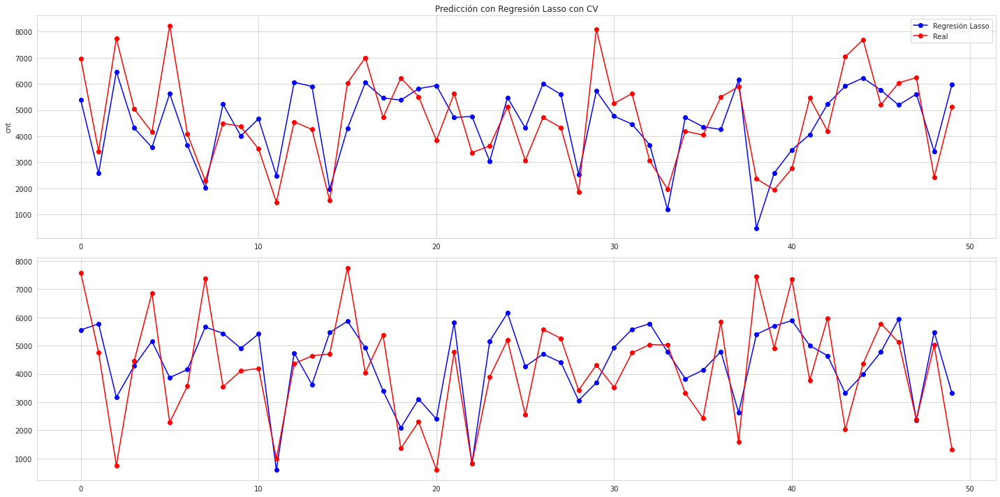

In [69]:
%matplotlib inline
fig, axs = plt.subplots(2,figsize=(20,10))

xvals = list(range(len(y_test[:50])))
axs[0].plot(xvals, y_pred_train[:50],'bo-', label='Regresión Lasso')
axs[0].plot(xvals, y_train[:50],'ro-', label='Real')

axs[1].plot(xvals, y_pred_test[:50],'bo-', label='Regresión Lasso')
axs[1].plot(xvals, y_test[:50],'ro-', label='Real')

axs[0].set(title='Predicción con Regresión Lasso con CV',ylabel=y_train.name)
axs[0].legend()

plt.tight_layout()
plt.show()

In [70]:
lasso_model = best_model['regresion']
fake_df = best_model['polinomial'].transform(X_test)
print(f'Intercepto: {lasso_model.intercept_}')
coef = list(zip(['Intercepto'] + list(fake_df.columns), [lasso_model.intercept_] + list(lasso_model.coef_)))
coef = pd.DataFrame(coef,columns=['Variable','Parámetro'])
coef.sort_values('Parámetro', ascending=False).head(10)

Intercepto: 1873.8416154354645


,Variable,Parámetro
0,Intercepto,1873.841615
1,Temp 1,209.779170
81,Temp wg_Other,103.802023
80,Temp wg_Mist,55.364536
162,Wind wg_Other,41.861697
108,Feel_Temp wg_Mist,40.898923
148,Wind season_Winter,33.998049
68,Temp holiday_No,22.692523
86,Temp weekday_Sunday,7.968309
89,Temp weekday_Wednesday,2.609602


In [71]:
coef[coef['Parámetro'].between(-1,1)]

,Variable,Parámetro
2,Feel_Temp 1,0.0
3,Hum 1,-0.0
4,Wind 1,0.0
5,season_Fall 1,0.0
6,season_Springer 1,-0.0
...,...,...
491,weekday_Sunday weekday_Tuesday,0.0
492,weekday_Sunday weekday_Wednesday,0.0
493,weekday_Thursday weekday_Tuesday,0.0
494,weekday_Thursday weekday_Wednesday,0.0


In [72]:
from joblib import dump, load

dump(best_model,'best_regressor_bp.pkl')

['best_regressor_bp.pkl']

# 7. Evaluacion e interpretacion de los modelos.

Para ambos modelos, despues de la busqueda de hiperparametros fue: 
- {'normalizar': 'passthrough',
 'polinomial__k': 2,
 'regresion': Lasso(alpha=200),
 'regresion__alpha': 200}

Los paramtros mas importantes para la prediccion en orden, fueron:


|   # |               Variable |   Parámetro |
|----:|-----------------------:|------------:|
|  0  |             Intercepto | 1873.841615 |
|  1  |                 Temp 1 |  209.779170 |
|  81 |          Temp wg_Other |  103.802023 |
|  80 |           Temp wg_Mist |   55.364536 |
| 162 |          Wind wg_Other |   41.861697 |
| 108 |      Feel_Temp wg_Mist |   40.898923 |
| 148 |     Wind season_Winter |   33.998049 |
|  68 |        Temp holiday_No |   22.692523 |
|  86 |    Temp weekday_Sunday |    7.968309 |
|  89 | Temp weekday_Wednesday |    2.609602 |

Siendo la temperatura, y su relacion con el grupo climatico lo mas importante para la prediccion.

¿Cuáles son las 3 variables más importantes para la predicción de la cantidad de
usuarios? 
* R:/ La temperatura, y la temperatura con su relacion con el clima


* Describa cual es el escenario ideal para el incremento de usuarios.


Segun las variables, entre la temperatura este mas alta, con clima sin niebla y sin lluvia.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


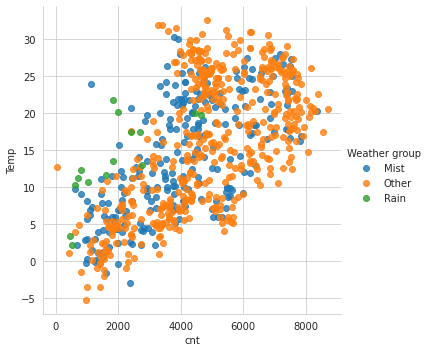

In [73]:
sns.lmplot('cnt', 'Temp', data=data, hue='Weather group', fit_reg=False)

plt.show()

* ¿Qué pasos adicionales deberían tener en cuenta para una próxima
iteración/mejora del modelo?

R:/ definir si la cuenta de usuarios es valida o no para realizar las predicciones del uso de bicicletas. Tomar una mayor cantidad de datos, y/o variables.